# Classifying Pulsar Stars

##### Nandini Nandini, Runqi Zong, Shiori Hasegawa, YunYun Wei

## Introduction 

Pulsars are a type of neutron star that emits strong electromagnetic radiation that can be picked up through machines on Earth. According to an article by Haitao Lin and Xiangru Li,  the universe is scattered with many undiscovered pulsars and relies on machine learning to detect characteristic radio waves that can be further interpreted to uncover new pulsars (Lin, et al, 2020). However, due to the unique waves that each pulsar can produce and potential wave interference in space, it is challenging to identify real pulsars with high precision. To explore this problem, classification models will be imposed upon the HTRU-2 dataset to explore solutions for identifying ‘real pulsars’.  With information on standard deviation, mean, and skewness of categorical variables such as DM-SNR curve, which stands for Dispersion Measure - Signal-to-Noise Ratio, that facilitates the process of identifying potential pulsars, integrated profiles which are summed up pulses detected from the pulsars, and kurtosis which is a statistical measure that separates pulsars to non-pulsars help come up with solutions building more accurate predictions models.

We will perform exploratory data analysis and visualization using the dataset “Pulsar Star Data” retrieved online from https://archive.ics.uci.edu/ml/datasets/HTRU2.


We will try to answer the question of how numerical variables such as excess kurtosis of the integrated profile and excess kurtosis of the DM-SNR curve help detect potential candidates that can be further classified as pulsars and non-pulsars.

## Information on Dataset
The dataset is a classification type data that has 17898 rows that represent a potential candidate for pulsar classification and 9 columns that outline the variables associated to the features of each of the candidates.

Integrated profile: this is essentially the pulse shape that depicts the frequency of the longitudinal radio waves that have been obtained over an average time period. 

DM-SNR curve: This is a statistical variable that outlines the ratio between signal to noise of the radio waves that were obtained. This helps identify essential characteristics of pulsars in space


In [1]:
#Run this cell before continuing. 
install.packages("themis")
install.packages("kknn")
library(repr)
library(tidyverse)
library(tidymodels)
library(cowplot)
library(themis)

options(repr.matrix.max.rows = 6) #limits output of data frames to 6 rows

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     

# Preliminary exploratory data analysis:


### Demonstrating that the dataset can be read from the web into R 

In [2]:
options(repr.matrix.max.rows = 6) #limits output of data frames to 6 rows

download.file("https://raw.githubusercontent.com/yunyun-wei/Group-project-proposal/main/HTRU_2.csv", "HTRU_2.csv")

pulsar_data <- read_delim("HTRU_2.csv", delim = ",",
  col_names= c("int_mean_profile",
               "int_sd_profile" ,
               "int_ex_kurtosis_profile",
               "int_skewness_profile",
               "dm_mean_curve",
               "dm_sd_curve",
               "dm_ex_kurtosis_curve",
               "dm_skewness_curve",
               "class"))
pulsar_data
print("Table 1: Original Pulsar Data Set")

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): int_mean_profile, int_sd_profile, int_ex_kurtosis_profile, int_skew...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


int_mean_profile,int_sd_profile,int_ex_kurtosis_profile,int_skewness_profile,dm_mean_curve,dm_sd_curve,dm_ex_kurtosis_curve,dm_skewness_curve,class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
140.5625,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,0
102.5078,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,0
103.0156,39.34165,0.3233284,1.0511644,3.121237,21.74467,7.735822,63.17191,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,0
114.5078,53.90240,0.2011614,-0.02478884,1.946488,13.38173,10.007967,134.238910,0
57.0625,85.79734,1.4063910,0.08951971,188.306020,64.71256,-1.597527,1.429475,0


[1] "Table 1: Original Pulsar Data Set"


## Cleaning and Wrangling the data

Now, we will clean the data in a tidy format to meet our analysis needs.First changing the data type of the class variable then renaming the numeric data into "pulsar" if it is 1 and "non-pulsar" if it was 0.

In [3]:
pulsar_data <- pulsar_data |>
    mutate(class = as_factor(class)) |> 
    mutate(class = fct_recode(class, "Pulsar" = "1", "Non_pulsar" = "0")) 
pulsar_data
print("Table 2 : Mutated Pulsar Data Set")

int_mean_profile,int_sd_profile,int_ex_kurtosis_profile,int_skewness_profile,dm_mean_curve,dm_sd_curve,dm_ex_kurtosis_curve,dm_skewness_curve,class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.5625,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,Non_pulsar
102.5078,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,Non_pulsar
103.0156,39.34165,0.3233284,1.0511644,3.121237,21.74467,7.735822,63.17191,Non_pulsar
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,Non_pulsar
114.5078,53.90240,0.2011614,-0.02478884,1.946488,13.38173,10.007967,134.238910,Non_pulsar
57.0625,85.79734,1.4063910,0.08951971,188.306020,64.71256,-1.597527,1.429475,Non_pulsar


[1] "Table 2 : Mutated Pulsar Data Set"


## Splitting in a training dataset
Now that our data is well-organized and in a tidy format, let's generate subsets and divide it into training and testing datasets.

Training Data: This subset is foundational for training predictive models to distinguish genuine from pulsar stars based on provided attributes. Analyzing this data helps uncover patterns for accurate predictions.

Testing Data: The testing data subset is vital for evaluating the reliability and performance of our predictive models. Once the system is trained on the training data, it's essential to assess its performance on unseen data to validate its generalization and accuracy.

In [4]:
set.seed(99) # for reproducibility

pulsar_split <- initial_split(pulsar_data, prop = 0.75, strata = class)

pulsar_train <- training(pulsar_split)
pulsar_test <- testing(pulsar_split)

In [5]:
set.seed(4)

select_pulsars <- filter(pulsar_data, class == "Pulsar") %>%
    slice_sample(n = 1000)

select_non_pulsars <- filter(pulsar_data, class == "Non_pulsar") %>%
    slice_sample(n = 1000)

## Summarizing 
Now, we will summarize the training data based on our predictive class variable. Based on the tables calculating variable means, we can see there is a discrepancy in the score on each variable between pulses and non-pulses. Additionally, Table 4 indicates that the data contains ten times more non-pulsars than pulsars in this data set. 

In [6]:
pulsar_summary <- pulsar_train|>
                group_by(class) |>
     			summarize(ave_int_mean = mean(int_mean_profile),
                          ave_int_sd_mean = mean(int_sd_profile),
                          ave_int_ex_mean = mean(int_ex_kurtosis_profile),
                          ave_int_skewness_mean = mean(int_skewness_profile),
                          ave_dm_mean = mean(dm_mean_curve),
                          ave_dm_sd_mean = mean(dm_sd_curve),
                          ave_dm_ex_kurtosis_mean = mean(dm_ex_kurtosis_curve),
                          ave_dm_skewness_mean = mean(dm_skewness_curve))
pulsar_summary                          
print("Table 3: Table of Variable Means")
pulsar_count <- pulsar_train |>
    group_by(class) |>
    summarize(count = n())
pulsar_count
print("Table 4 :Count for Pulsar and Non-pulsar Classes")

class,ave_int_mean,ave_int_sd_mean,ave_int_ex_mean,ave_int_skewness_mean,ave_dm_mean,ave_dm_sd_mean,ave_dm_ex_kurtosis_mean,ave_dm_skewness_mean
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Non_pulsar,116.63794,47.33211,0.2087071,0.3761412,8.893639,23.22739,8.903303,114.82061
Pulsar,56.78993,38.82120,3.1252669,15.5814751,49.816138,56.24653,2.794118,18.78886


[1] "Table 3: Table of Variable Means"


class,count
<fct>,<int>
Non_pulsar,12164
Pulsar,1259


[1] "Table 4 :Count for Pulsar and Non-pulsar Classes"


## Methods
- In order to make predictions in classifying whether the data point is pulsar or non-pulsar, we used the excess kurtosis of the integrated profile and excess kurtosis of the DM-SNR curve as listed in the data set as the predictors. Using a scatter plot graph, the relationship between the predictors can be identified. 
Note: The excess kurtosis of the integrated profile will be on the x axis and the excess kurtosis of the DM-SNR curve will be on the y axis.
- The data points are coloured based on the categorization of a pulsar or non_pulsar.
- Scatterplots are also put in place to identify the strength of the relationship between the predictors. This gives more context for picking variables that can maximize the precision and accuracy of identifying real pulsars in future observations.
- A knn model will be built using scatter plot graphs to help predict new observations that could be potential candidates for pulsars. This requires using 5-fold validation models to determine the best K used to maximize prediction accuracies.
- The confusion matrix will also be put in place to help analyze the reliability and stability of the model


## Visualization
We decided to compare the Excess Kurtosis of the Integrated Profile and DM-SNR curve to help us predict whether a new observation is a pulsar or a non-pulsar. Based on the graphs below, it is clear that most observations with lower scores in the Excess Kurtosis of the Integrated Profile are Non-pulsars. The higher the score, the more likely the observation will be a pulsar. Since there is a clear division between these two variables, using them would be beneficial and reliable predictions.


[1] "Fig 1: Relationship between Excess Kurtosis of Integrated Profile and Excess Kurtosis of DM-SNR Curve"


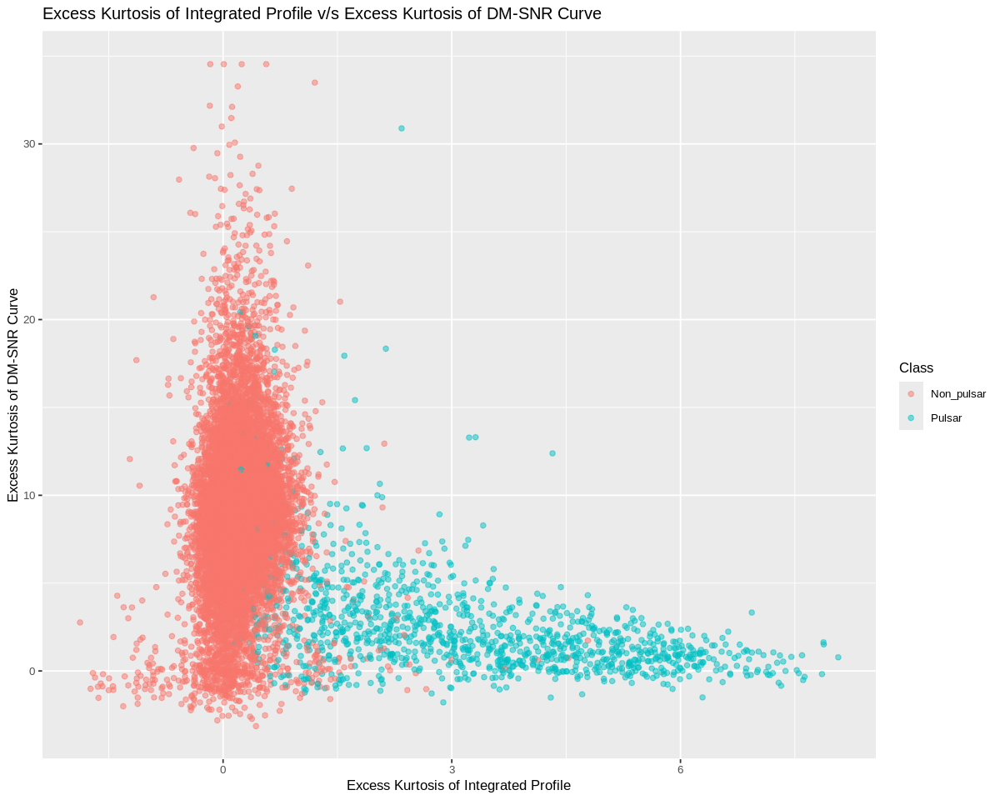

In [7]:
options(repr.plot.width = 10, repr.plot.height = 8)

kurtosis_pulsar_plot <-  ggplot(pulsar_train, aes(x = int_ex_kurtosis_profile,  y = dm_ex_kurtosis_curve, colour = class)) +
                    geom_point(alpha = 0.5) +
                    labs(x = "Excess Kurtosis of Integrated Profile", y = "Excess Kurtosis of DM-SNR Curve",
                    title = "Excess Kurtosis of Integrated Profile v/s Excess Kurtosis of DM-SNR Curve", colour = "Class") +
                    theme(text= element_text(size = 10))
kurtosis_pulsar_plot
print("Fig 1: Relationship between Excess Kurtosis of Integrated Profile and Excess Kurtosis of DM-SNR Curve")



## Methods Cont.
To standardize and process “pulsar_train” data: pass vector “class” and the predictors “all predictors” so represented by a . to the recipe function. All predictors were centred and scaled. To pick the best k that gives the best accuracy, tune the model. Each parameter in the model should be specified as tune() rather than given a particular value.

In [8]:
set.seed(2020)
pulsar_recipe<- recipe(class ~ int_ex_kurtosis_profile + dm_ex_kurtosis_curve, data= pulsar_train)|>
step_center(all_predictors())|>
step_scale(all_predictors()) |>
step_downsample(class, under_ratio = 1)

k_vals <- tibble(neighbors = seq(from = 1, to = 50, by = 2))

knn_spec<-nearest_neighbor(weight_func= "rectangular", neighbors= tune())|>
set_engine('kknn')|>
set_mode('classification')
knn_spec

K-Nearest Neighbor Model Specification (classification)

Main Arguments:
  neighbors = tune()
  weight_func = rectangular

Computational engine: kknn 


Splits training data “pulsar_train” into 5 v folds automatically, which seems to be a reasonable number since a larger number of folds only reduces standard error by an insignificant amount. Set the strata argument to the categorical label variable “class” to ensure that the training and validation subsets contain the right proportions for each category of observation.


In [9]:
pulsar_vfold<-vfold_cv(pulsar_train, v=5, strata= class)

Created workflow analysis that combines “pulsar_recipe” and “knn_spec” model specifications. Fit the “knn_spec” model for each value in a range of parameter values with tune_grid. Aggregate the mean and standard error by using collect_metrics.To find the best value of the number of neighbours, filter accuracy from the .metric column. We created a line plot using the “pulsar_accuracy” dataset with neighbours on the x-axis and mean on the y-axis to visualize the best value of the number of neighbours. From the plot below, K = 45 provides the highest accuracy. Other K values result in a reduced accuracy estimate of the classifier. 


$title
[1] "Accuracy Plot on Training Data Set"

attr(,"class")
[1] "labels"

[1] "Fig 2: Accuracy Plot on Training Data Set"


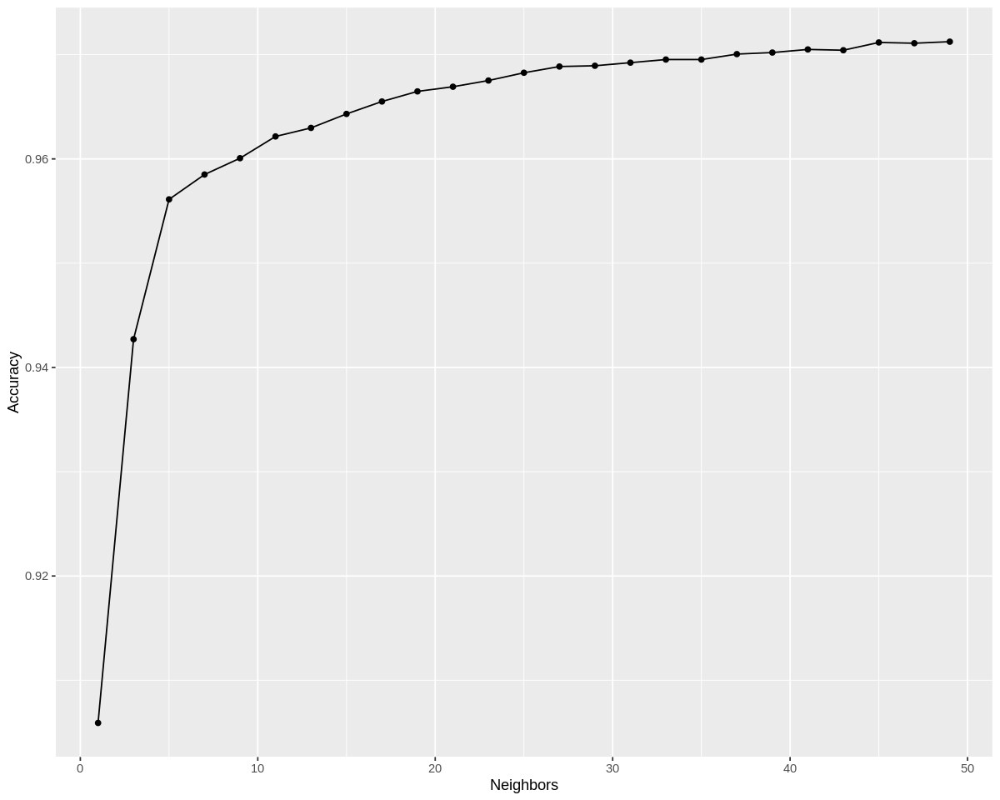

In [10]:
pulsar_results<-workflow() |>
add_recipe(pulsar_recipe) |>
add_model(knn_spec)|> 
tune_grid(resamples= pulsar_vfold, grid= k_vals) |>
collect_metrics()

pulsar_accuracy<- filter(pulsar_results, .metric=="accuracy")

cross_val_plot <- ggplot(pulsar_accuracy, aes(x = neighbors, y = mean))+
geom_point() +
geom_line() +
labs(x ="Neighbors", y = "Accuracy")
ggtitle("Accuracy Plot on Training Data Set")
cross_val_plot
print("Fig 2: Accuracy Plot on Training Data Set")

In [16]:
final_knn_spec<-nearest_neighbor(weight_func= "rectangular", neighbors= 45)|>
set_engine('kknn')|>
set_mode('classification')

pulsar_fit<- workflow()|>
add_recipe(pulsar_recipe)|>
add_model(final_knn_spec)|>
fit(data= pulsar_train)
pulsar_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
3 Recipe Steps

• step_center()
• step_scale()
• step_downsample()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(45,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.06433678
Best kernel: rectangular
Best k: 45

We created k-nearest neighbour classifier with the best k, specifying k = 9 from the “Accuracy vs Neighbours” graph.


[1] "Figure 3: Scatter plot of Excess Kurtosis of Integrated Profile versus Excess Kurtosis of DM-SNR Curve where background color indicates the decision of the classifier."


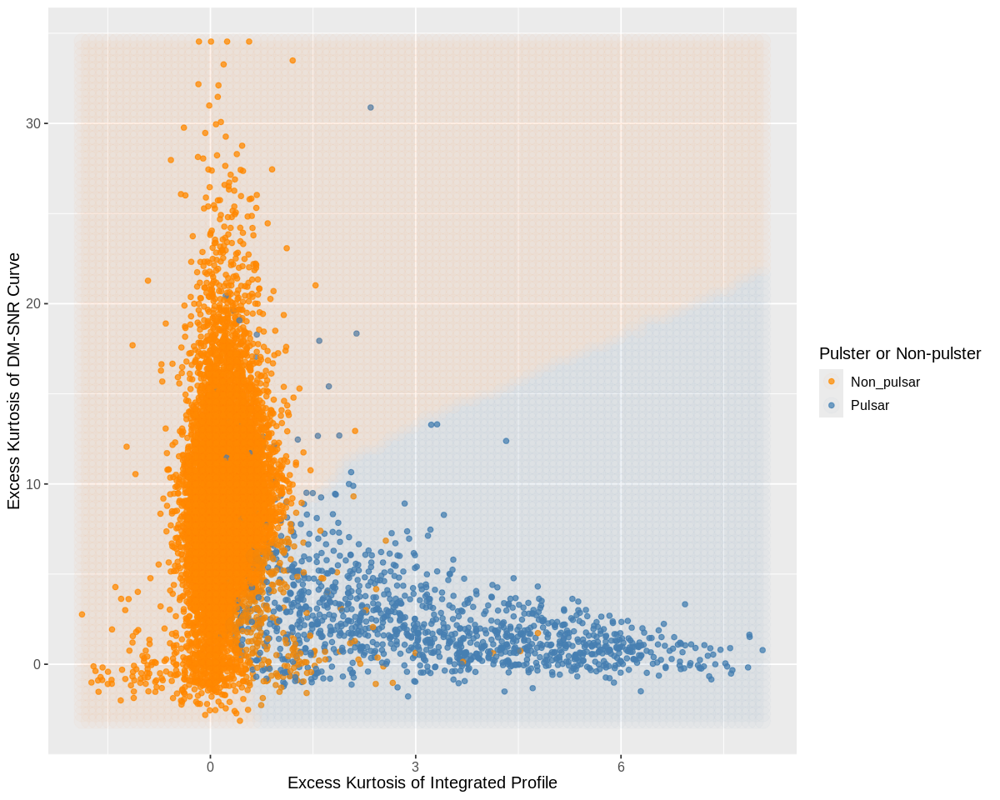

In [19]:
are_grid <- seq(min(pulsar_train$int_ex_kurtosis_profile),
                max(pulsar_train$int_ex_kurtosis_profile),
                length.out = 100)
smo_grid <- seq(min(pulsar_train$dm_ex_kurtosis_curve),
                max(pulsar_train$dm_ex_kurtosis_curve),
                length.out = 100)
asgrid <- as_tibble(expand.grid(int_ex_kurtosis_profile = are_grid,
                                dm_ex_kurtosis_curve = smo_grid))

# use the fit workflow to make predictions at the grid points
knnPredGrid <- predict(pulsar_fit, asgrid)

# bind the predictions as a new column with the grid points
prediction_table <- bind_cols(knnPredGrid, asgrid) |>
  rename(Class = .pred_class)
wkflw_plot <- ggplot() +
  geom_point(data = pulsar_train,
             mapping = aes(x = int_ex_kurtosis_profile,
                           y = dm_ex_kurtosis_curve,
                           color = class),
             alpha = 0.75) +
  geom_point(data = prediction_table,
             mapping = aes(x = int_ex_kurtosis_profile,
                           y = dm_ex_kurtosis_curve,
                           color = Class),
             alpha = 0.02,
             size = 5) +
  labs(color = "Pulster or Non-pulster",
       x = "Excess Kurtosis of Integrated Profile",
       y = "Excess Kurtosis of DM-SNR Curve") +
  scale_color_manual(values = c("darkorange", "steelblue")) +
  theme(text = element_text(size = 12))

wkflw_plot
print("Figure 3: Scatter plot of Excess Kurtosis of Integrated Profile versus Excess Kurtosis of DM-SNR Curve where background color indicates the decision of the classifier.")


Train the classifier “pulsar_best_k_model” with the training data set “pulsar_train” using workflow.

Pass fitted model “pulsar_fit” and the test dataset “pulsar_test” to the predict function, then bind_cols to add the column of predictions to the original test data.



In [ ]:
pulsar_predictions<- predict(pulsar_fit, pulsar_test)|>
bind_cols(pulsar_test)

pulsar_metrics<- pulsar_predictions|>
metrics(truth= class, estimate= .pred_class)
pulsar_metrics
print("Table 5: Accuracy Results for Testing Data")

Based on the accuracy results of the testing data set and the training dataset in the table, there seems to be no discrepancy between the estimated accuracy for either the testing data or the training data. (as they are both around 96% accurate). This tells us there is no overfitting behaviour within the model and that it ensures an accurate scatterplot.


In [ ]:
pulsar_conf_mat<-pulsar_predictions|>
conf_mat(truth= class, estimate= .pred_class)
pulsar_conf_mat
Print("Table 6: Confusion Matrix Table")

This matrix provides insight into the performance of the classification model:
- The model correctly identified 3903 instances as non-pulsars.
- It incorrectly classified 34 instances as pulsars when they were non-pulsars.
- It missed 192 instances that were actually pulsars.
- It correctly identified 346 instances as pulsars.

In total, it misclassified 226 observations, whereas 4249 observations were classified truly.


## Results
Type of algorithm: Since this dataset aims to categorize the data into two classes (pulsar or non-pulsar), the knn nearest neighbour classification approach is used to build the model.

Picking the best K: a workflow was built that contains the pulsar recipe and knn_spec models that would help find the most optimal k value. From the accuracy plot, it tells us that the most optimal k value would be k=45 as it depicts the highest point of the accuracy plot.

Testing for accuracy (use of conf matrix): Apart from the fact that k=45 gives the highest accuracy estimate on the accuracy plot as depicted from Table 5 shows an accuracy estimate of  96% which means the model is 96% accurate. This provides a level of reassurance that explanatory variables, excess kurtosis of the integrated profile and excess kurtosis of the DM-SNR curve,  has a well established relationship. The fact that the accuracy plot doesn’t fluctuate after k=45 also reassures the fact that the model is reliable.

Visualization of Boundary plot: The boundary plot was used to confirm there are no overfitting issues in the prediction plots. As expected, the two areas are separated by a clean boundary which indicates there are no overfitting issues.
issues.


## Discussion

The analysis focused on classifying potential pulsar candidates based on statistical variables derived from integrated profile and DM-SNR curve data. The visualization and analysis indicated that there is a clear subset distinction between pulsars and non-pulsars based on the selected predictors. The K-nearest neighbors (KNN) classification model, optimized with a K value of 45, achieved a high accuracy of 96% in predicting pulsar classification. Additionally, boundary plots confirmed the absence of overfitting issues, enhancing confidence in the model's reliability. Overall, the project underscores the effectiveness of statistical analysis and KNN classification in pulsar identification. While achieving a 96 % accuracy rate is impressive, it's important to acknowledge that classifiers inevitably make some errors. Therefore, despite this high accuracy, it doesn't guarantee a flawless model, as there's still potential for misclassification when dealing with new observations; as we saw in the confusion matrix, around  226 predictions were misclassified. 

Overall, the findings align with expectations, as the analysis successfully identified distinct patterns in the features of pulsar stars in the boundary plot and demonstrated the effectiveness of the KNN classification approach. The high accuracy of the model provides confidence in its ability to classify new observations accurately based on the provided features.

Pulsars are important in astronomy. They emit light at a constant pace, which helps scientists discover what is happening in space and measure the distance between objects in space(Lea, 2023). Therefore, accurately detecting a pulser could help us gather more information and uncover the secrets of the Universe..






## Expected outcance
What do you expect to find?
What impact could such findings have?
What future questions could this lead to?

- We expect to find distinct trends and relationships displayed in the scatterplot that could help make distinct observations and separation between pulsar data points and non-pulsar data points.
- Such findings could help build a knn model to help classify and predict further potential pulsar candidates as either a pulsar or non-pulsar.
- Building an accurate model can help scientists efficiently detect pulsars that were under the radar and expand our knowledge about spes?



## Significance
Pulsars are important in astronomy. They emit light at a constant pace, which helps scientists discover what is happening in space and measure the distance between objects in space(Lea, 2023). Therefore, accurately detecting a pulser could help us gather more information and uncover the secrets of the Universe.


## Future Questions
- Despite using the model,  accuracy and precision might not be ensured through binary classification. This opens up to further questions on whether there are other methods that can give more accurate results and predictions.
- In a scientific perspective, how does building accurate prediction models of pulsars contribute to our understanding of space time?
- Can such data on pulsars offer more insight to building more useful human technologies that aim to explore more territory in space? In what way?
- Is there a correlation between the mean integrated profile and the Excess kurtosis of the DM-SNR curve of pulsar candidates?

# References
Lin, Haitao, et al. “Pulsars Detection by Machine Learning with Very Few Features.” Monthly Notices of the Royal Astronomical Society, vol. 493, no. 2, 28 Jan. 2020, pp. 1842–1854, https://doi.org/10.1093/mnras/staa218. Accessed 28 Apr. 2021.
Lyon, Robert. “UCI Machine Learning Repository.” Archive.ics.uci.edu, 1987, archive.ics.uci.edu/dataset/372/htru2.

Lea, R. (2023, January 24). What are pulsars?. Space.com. https://www.space.com/32661-pulsars.html 


## Data Citation
 Robert Lyon (2017), https://archive.ics.uci.edu/dataset/372/htru2, UC Irvine Machine Learning Repository